<a href="https://colab.research.google.com/github/himanshudas13/Object_detection/blob/main/mainClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install a package using pip within Python code.
!pip install tensorflow opencv-python matplotlib
!pip install tensorflow-gpu
# Check the installed packages.
# !pip freeze

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
!pip list

Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.9.5
aiosignal                        1.3.1
alabaster                        0.7.16
albumentations                   1.3.1
altair                           4.2.2
annotated-types                  0.7.0
anyio                            3.7.1
argon2-cffi                      23.1.0
argon2-cffi-bindings             21.2.0
array_record                     0.5.1
arviz                            0.15.1
astropy                          5.3.4
astunparse                       1.6.3
async-timeout                    4.0.3
atpublic                         4.1.0
attrs                            23.2.0
audioread                        3.0.1
autograd                         1.6.2
Babel                            2.15.0
backcall                         0.2.0
beautifulsoup4                   4.12.3
bidict                           0.23.1

In [ ]:
import tensorflow as tf
import os

In [ ]:
gpus= tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)


In [ ]:
import cv2
import imghdr
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
extensns=['png','jpg','jpeg']

In [ ]:
data="/content/drive/MyDrive/Images"
# os.listdir(data)
for category in os.listdir(data):
  for img in os.listdir(os.path.join(data,category)):
    image_path=os.path.join(data,category,img)
    try:
      photo=cv2.imread(image_path)
      typ=imghdr.what(image_path)
      if typ not in extensns:
        os.remove(image_path)
      # print(photo)
      # plt.imshow(photo)
      # plt.show()
    except Exception as e:
      print("Erroneous image")



In [ ]:
data_pipeline=tf.keras.utils.image_dataset_from_directory(data)
data_iterator=data_pipeline.as_numpy_iterator()
#next works like an for loop
# batch=data_iterator.next()

Found 266 files belonging to 4 classes.


In [ ]:
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
# print(len(batch[0]))   #32 i.e  batch size
# print(len(batch))      #2 , one image and other the label
# batch[0]
# batch[0].shape

32
2


(32, 256, 256, 3)

[2 2 0 1 2 0 2 0 0 3 1 2 3 1 2 2 1 0 1 2 2 2 0 2 0 2 2 1 1 0 2 0]


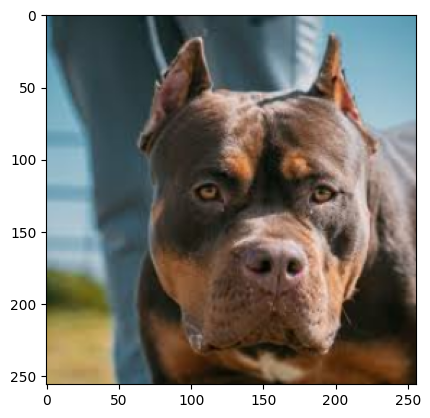

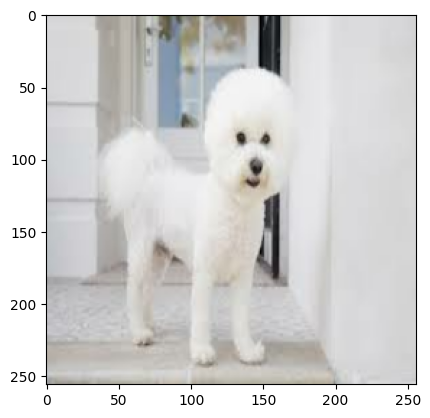

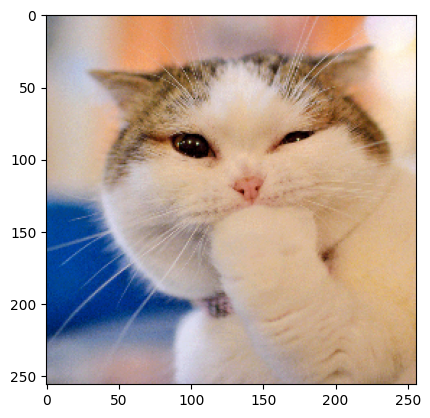

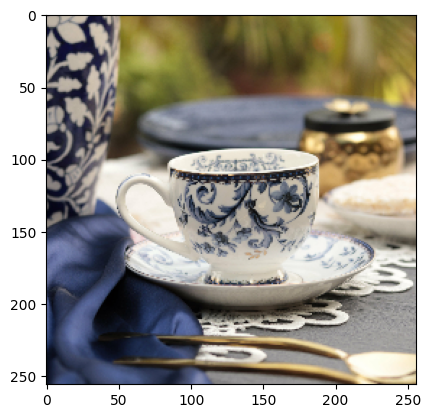

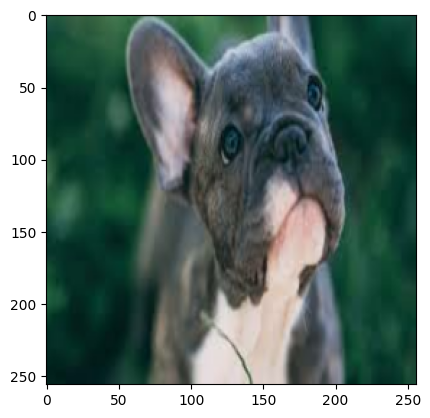

...

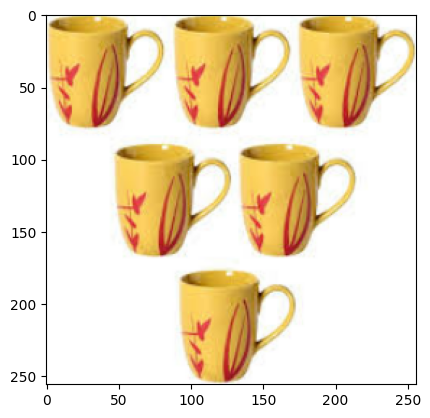

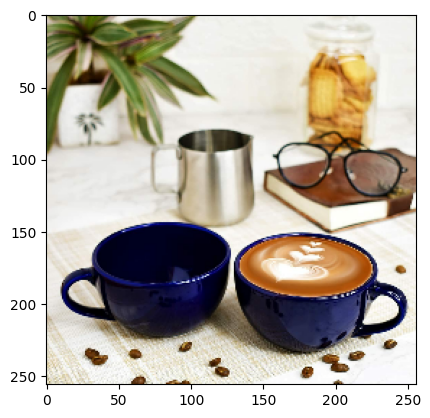

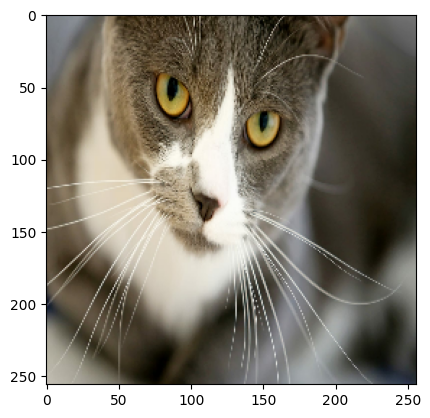

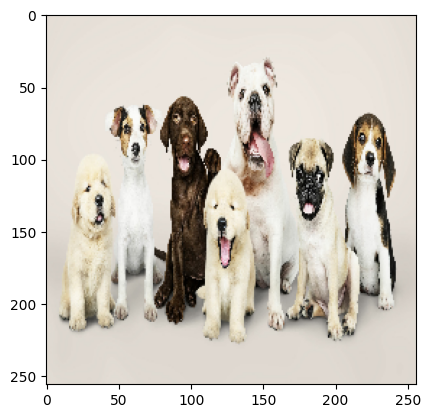

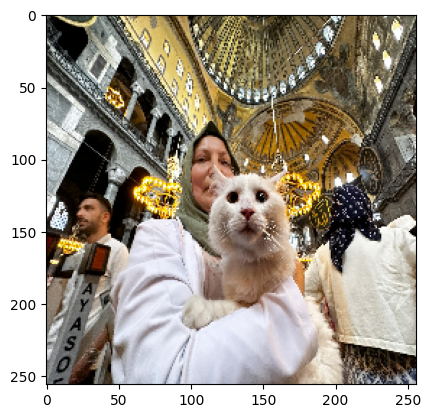

In [ ]:
print(batch[1])
for image in batch[0]:
  plt.imshow(image.astype(int))
  plt.show()

  #dog is 1 cat is 0

**DATA** **PREPROCESSING**-SCALE & SPLIT

In [ ]:
# batch[0]
batch[0].min()
batch[0].max()
# min max scaling
batch[0]=batch[0]/255

TypeError: 'tuple' object does not support item assignment

In [ ]:
data=data_pipeline.map(lambda x,y:(x/255,y))

In [ ]:
data.as_numpy_iterator().next()
print(data.as_numpy_iterator().next()[0].max()) #1
print(data.as_numpy_iterator().next()[0].min()) #0

1.0
0.0


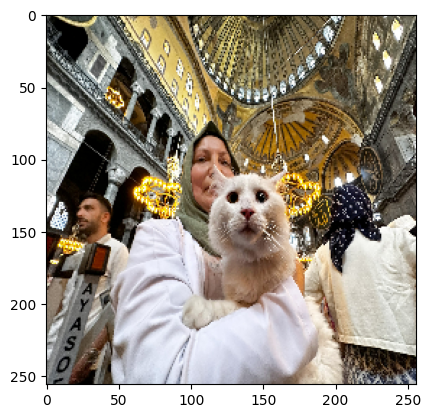

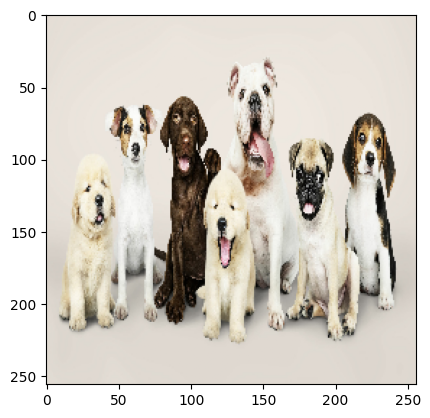

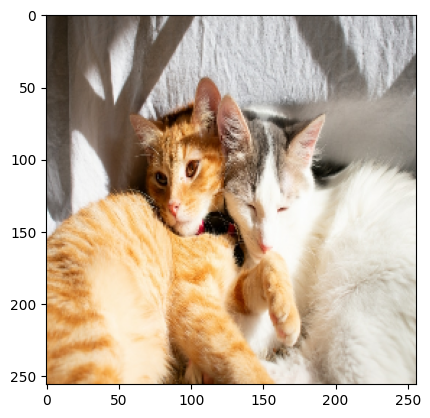

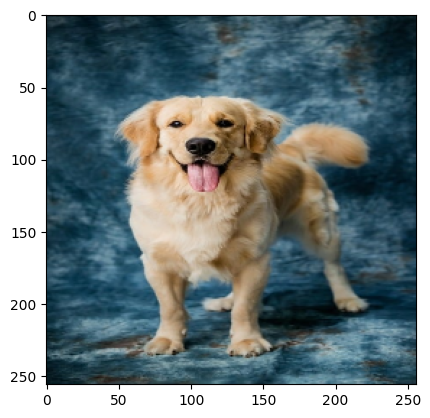

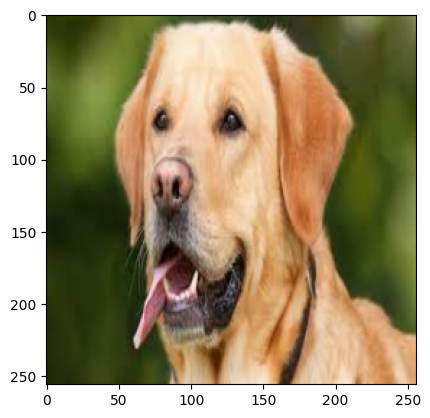

...

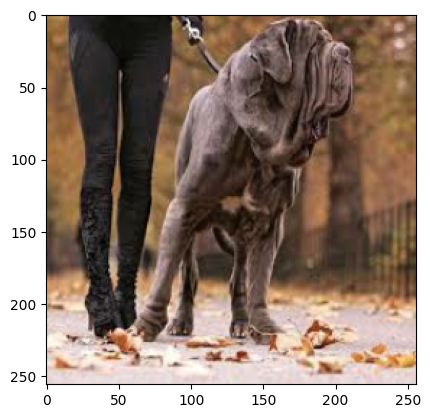

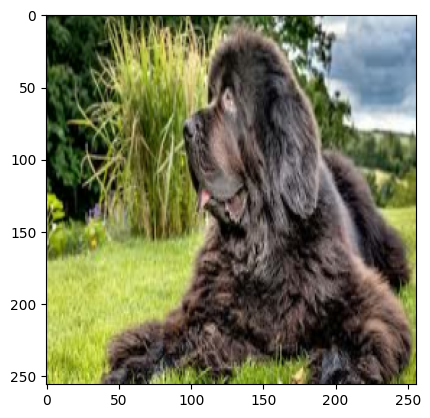

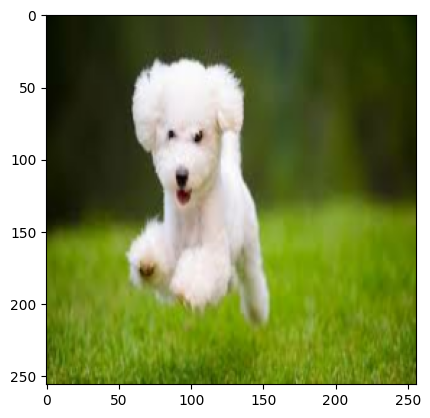

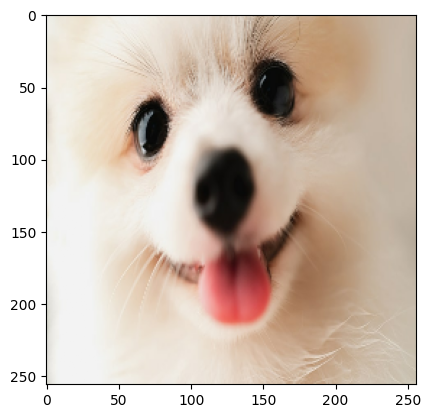

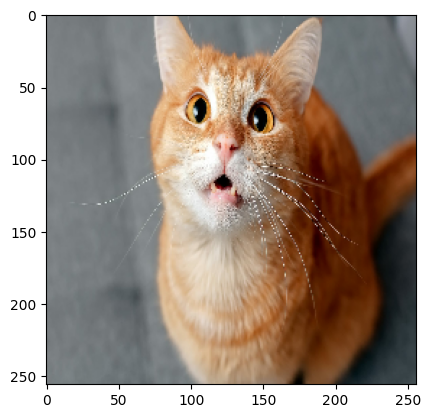

In [ ]:
# for image in data.as_numpy_iterator().next()[0]:
#   plt.imshow(image)
#   plt.show()

In [ ]:
print(len(data)) #4
train_size=4;
val_size=2;
test_size=1;

9


In [ ]:
train=data.take(train_size)
val=data.skip(train_size).take(val_size)
test=data.skip(train_size+val_size).take(test_size)

**MODEL**

In [ ]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten

# Define the model
num_classes = 4 # Replace with the actual number of classes

model = Sequential()
model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))  # Output layer with softmax activation



In [ ]:
# Compile the model
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # Use sparse_categorical_crossentropy for integer labels
    metrics=['accuracy']
)


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 123008)            0         
                                                                 
 dense (Dense)               (None, 256)               3

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten

model=Sequential()
model.add(Conv2D(16,(3,3),1,activation='relu',input_shape=(256,256,3)))
model.add(MaxPooling2D())

model.add(Conv2D(32,(3,3),1,activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

In [ ]:
model.compile('adam',loss=tf.losses.BinaryCrossentropy(),metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 127, 127, 16)      0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 62, 62, 32)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 123008)            0         
                                                                 
 dense_4 (Dense)             (None, 256)              

In [ ]:
logdir='/content/drive/MyDrive/logs'
tensorboard_callback=tf.keras.callbacks.TensorBoard(log_dir=logdir)


In [ ]:
hist=model.fit(train,epochs=20,validation_data=val) # add callback tensorboard_callback

Epoch 1/20
2/2 [==============================] - 11s 4s/step - loss: 13.5400 - accuracy: 0.4062 - val_loss: 11.9318 - val_accuracy: 0.2812
Epoch 2/20
2/2 [==============================] - 9s 5s/step - loss: 16.3225 - accuracy: 0.2969 - val_loss: 11.1689 - val_accuracy: 0.3750
Epoch 3/20
2/2 [==============================] - 7s 4s/step - loss: 8.6499 - accuracy: 0.2500 - val_loss: 2.7523 - val_accuracy: 0.4688
Epoch 4/20
2/2 [==============================] - 8s 5s/step - loss: 2.5209 - accuracy: 0.5156 - val_loss: 2.2663 - val_accuracy: 0.5312
Epoch 5/20
2/2 [==============================] - 7s 4s/step - loss: 2.8095 - accuracy: 0.4062 - val_loss: 2.0391 - val_accuracy: 0.3750
Epoch 6/20
2/2 [==============================] - 6s 3s/step - loss: 1.6569 - accuracy: 0.4844 - val_loss: 1.3936 - val_accuracy: 0.7188
Epoch 7/20
2/2 [==============================] - 8s 5s/step - loss: 1.5191 - accuracy: 0.5781 - val_loss: 1.2340 - val_accuracy: 0.5938
Epoch 8/20
2/2 [====================

In [ ]:
#hist.history

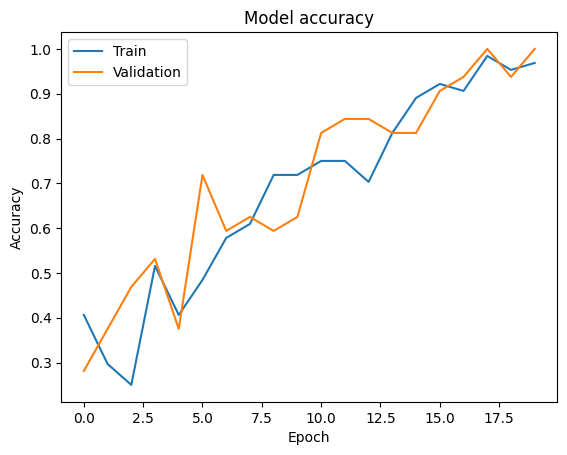

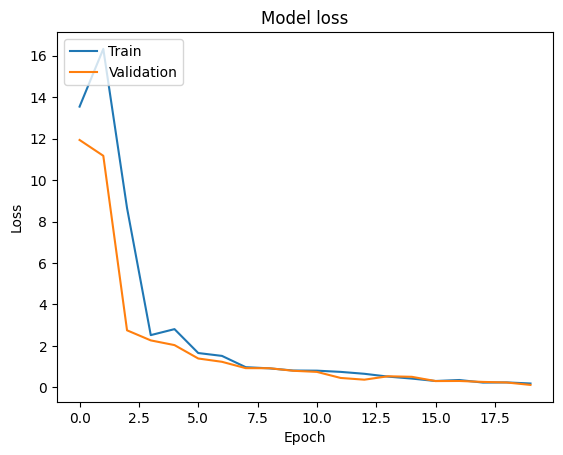

In [ ]:
# prompt: plot all the performance metrics recorded in hist

import matplotlib.pyplot as plt
# Get the list of metric names
metric_names = list(hist.history.keys())

# Plot the training and validation accuracy
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the training and validation loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
model.save('/content/drive/MyDrive/my_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from tensorflow.keras.models import load_model
model = tf.keras.models.load_model('/content/drive/MyDrive/my_model.h5')


In [ ]:

from tensorflow.keras.metrics import Precision, Recall, CategoricalAccuracy

# Assuming 'test' is your test dataset
# Define the precision, recall, and accuracy metrics
precision = Precision()
recall = Recall()
categorical_accuracy = CategoricalAccuracy()

# Iterate over the test dataset
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    yhat_classes = np.argmax(yhat, axis=1)

    # Update the metrics
    precision.update_state(y, yhat_classes)
    recall.update_state(y, yhat_classes)
    categorical_accuracy.update_state(y, yhat_classes)

# Print the results
print(f'Precision: {precision.result().numpy()}, Recall: {recall.result().numpy()}, Accuracy: {categorical_accuracy.result().numpy()}')


1/1 [==============================] - 2s 2s/step
Precision: 1.0, Recall: 1.0, Accuracy: 1.0


In [ ]:
import cv2

# Load the pre-trained model
# model = ... # Ensure your model is loaded here

# Define the class names
class_names = ['cat', 'cup', 'dog', 'man']

# Function to preprocess the frame
def preprocess_frame(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    frame = tf.image.resize(frame, (256, 256))  # Resize frame to (256, 256)
    frame = frame / 255.0  # Normalize the frame
    return frame

# Open a connection to the webcam (use 0 for the default webcam)
cap = cv2.VideoCapture(0)

while True:
    # Read a frame from the webcam
    ret, frame = cap.read()
    if not ret:
        break

    # Preprocess the frame
    preprocessed_frame = preprocess_frame(frame)

    # Predict the class probabilities
    yhat = model.predict(np.expand_dims(preprocessed_frame, axis=0))

    # Get the class with the highest probability
    predicted_class = np.argmax(yhat, axis=1)

    # Get the predicted class label
    predicted_label = class_names[predicted_class[0]]

    # Display the predicted label on the frame
    cv2.putText(frame, f'Predicted: {predicted_label}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    # Show the frame with the predicted label
    cv2.imshow('Real-Time Classification', frame)

    # Break the loop if 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close the window
cap.release()
cv2.destroyAllWindows()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


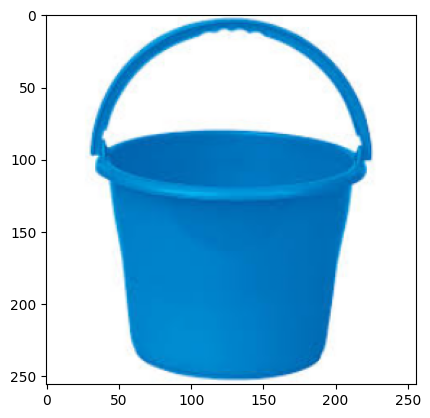

1/1 [==============================] - 0s 376ms/step
Predicted class: cup


In [ ]:
import cv2


# Load and preprocess the image
img = cv2.imread('/content/img6.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
img = tf.image.resize(img, (256, 256))  # Resize image to (256, 256)
img = img / 255.0  # Normalize the image

# Display the image
plt.imshow(img.numpy())
plt.show()

# Predict the class probabilities
yhat = model.predict(np.expand_dims(img, axis=0))

# Get the class with the highest probability
predicted_class = np.argmax(yhat, axis=1)

# Assuming class_names contains the names of the classes
class_names = ['cat', 'cup', 'dog', 'man']

# Print the predicted class label
print(f"Predicted class: {class_names[predicted_class[0]]}")
